# Week 5

Phew. You've handed in the assignment. But there's not resting now. We're just hitting out grove, so let's get going!! Much to get through today.

## The plan for today

We continue learning about dataviz by focusing on data with two variables and their relationships. The lecture today has the following parts:
* In part 1, we talk about exploring data with two variables, make some logarithmic plots and think about what we have read in DAOST.
* Then, in part 2, we use sklearn and have fun with linear regression.

Ok. Now it's time to get started.

## Part 1: Exploratory data visualzation, two variables  

I told you how I love the Data Analysis with Open Source Tools book. You had to read Chapter 3, which is about visualizing data with two variables, before coming to class today. If you haven't yet, this is the time to do it! 

*Reading*: DAOST Chapter 3 up to *Graphical Analysis and Presentation Graphics* on page 68 in the PDF. **You will have to go and get it on DTU Learn due to the copyright stuff**.

And now a few exercises to reflect on the text:

*Exercise:* Questions from DAOST Chapter 3.

> * Looking at Fig 3-1, Janert writes "the data itself shows clearly that the amount of random noise in the data is small". What do you think his argument is?

His argument is that the data follows a very clear pattern without outliers to shadow the trend of the data. Not meaning that there can't be outliers or other data errors, but these problems are systematic ones that can be dealt with.

> * Can you think of a real-world example of a multivariate relationship like the one in Fig 3-3 (lower right panel)?

Productivity versus number of coffees in a day. In the beginning, people will have the same level of productivity, but as the day goes, people that have not had much coffee will get a lower productivity and people that continously drink coffee will see a rise in productivity again. 

> * What are the two methods Janert metions for smoothing noisy data? Can you think of other ones?

Spline and LOESS. 
The random method, simple moving average, random walk, simple exponential, and exponential moving average are some of the other methods used for data smoothing. Read more about them here: https://corporatefinanceinstitute.com/resources/business-intelligence/data-smoothing/ 

> * What are residuals? Why is it a good idea to plot the residuals of your fit?

Residuals are the remainder when you subtract the smooth "trend" from the actual data, and they take positive and negative values if there are above or below.
Plotting the residuals is a good idea to see if the smoothing of the data has been a good fit. The closer the residuals are to the smoothed fitted data (0) without large trends, the better a fit it shows us.

> * Explain in your own words the point of the smooth tube in figure 3-7.

A smooth tube kind of works like a confidence interval of the residuals. It gives one line/curve for the negative residuals and one line/curve for the positive residuals. The smooth tube therefore tells us that the majority of data points will lie between these two lines/curves.

> * What the h#ll is banking and what part of our visual system does it use to help us see patterns? What are potential problems with banking?

Banking is another graphical method, that does not work on the data (like logarithmic) but on the plot as a whole chaning its aspect ratio. The idea of banking is to adjust the aspect ratio of the entire plot so that most slopes are at a 45 degree angle. 45 degrees as changes are easier to read for the human eye then an almost vertical or horizontal line, so the purpose is for human conception, by manipulating primarily the axis.

> * Summarize the discussion of Graphical Analysis and Presentation Graphics on pp. 68-69 in your own words.

Graphical analysis refers to exploring data visually and gaining new unexpected insights. Here you might make many plots and test out many different things
Presentation graphics are about how to present those insights so that they are easily understood. Here you choose the plots that tell your story and perfect them so that the information can be presented to others.
Basically, there are many things to consider when during presentation graphics, that one can follow as a checklist. But in general, data visualization is about taste, and it is extremely important to put yourself in the shoes of the receiver of your visualization, so that you understand what they need and will be able to apply.

Ok. Let's briefly talk about logarithms and logarithimic plots (if you take my networks class in the fall semester you'll se lots of loglog plots since they're important for understanding a key property of networks).

*Exercise 2.2*: Logarithms and logarithmic plots. 

> * First, a couple of questions:
>    * What kind of relationships will a semi-log plot help you discover?

A semi log plot is where you smooth the data of one variable with a logarithmic scale, while the other variable remains in its original form. This way we can smooth out a curvy relationship to fall on a straight line, where the slope of the line is of great interest. In a semi-log plot, relative changes have the same size, no matter how large the corresponding absolute change.

>    * What kind of functions will loglog plots help you see?

In double logarithmic plots, we plot the logarithm of both x and y, and it can give us a much clearer understanding of the distribution of data points. They reveal power-law relationships by turning them into straight lines.

> * Second, we are going to create a version of [this plot](https://github.com/suneman/socialdata2022/blob/main/files/CrimeOccurrencesByCategory.png) from Week 1, where you display the $y$-axis on log-scale. 
> * Third, let's also try a loglog plot. Inspired by [this article](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0183110) I would expect that especially theft could be characterized by a power law distribution also in San Francisco. Let's see if I'm right. 
>   - *Step 1:* Divide San Francisco into a grid **roughly** $100m \times 100m$. You can, for example use numpy to do this, I would call `np.histogram2d`, and searching the internet, it seems that there are also [ways to do this in pandas](https://stackoverflow.com/questions/39254704/pandas-group-bins-of-data-per-longitude-latitude). The earth isn't flat,so `lat,` `lon` aren't really squares, but it is OK to ignore. 
>       * **Hint 1**. I really mean approximately 100 meters. It can also be 200 meters. Or 80 meters. Or 300.
>       * **Hint 2**. Ignore outliers. We only want points that are on the SF peninsula
>       * **Hint 3**. We've made a little example of how you can do the binning. Get it [here](https://github.com/suneman/socialdata2022/blob/main/lectures/Week5_binning.ipynb).
>   - *Step 2:* Count the number of thefts occurring within each grid-square (use all data for all time).
>   - *Step 3:* Tally the counts. Count the number of squares with $k=0$ thefts. We call this $N(0)$. Next, count the number of grids with one crime to get $N(k=1)$. Keep going like this all the way up to $k=C_{max}$, where $C_{max}$ is the highest count of crimes you find in any grid space. 
>     * *Extra tip*: If you want all the details on binning for loglog axes, you can check out [Lecture 2, Part 3](https://github.com/SocialComplexityLab/socialgraphs2021/blob/main/lectures/Week2.ipynb) in my social graphs course.
>   - *Step 4:* Plot the distribution of $k+1$ vs $N(k)$ on linear axes.
>   - *Step 5:* Plot the distribution of $k+1$ vs $N(k)$ on loglog axes.
>   - *Step 6:* Answer the question. Was Sune correct in assuming that there is a power-law distribution of theft?

In [16]:
# import packages and data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

focuscrimes = ['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']

data = pd.read_csv("/Users/sorenbendtsen/Documents/DTU Business Analytics/1st Semester/Social Data Analysis and Visualization/F1Exercises/Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv")
# Convert Date to a datetime format
data["Date"] = pd.to_datetime(data["Date"])
# Make a subset without 2018, as we only look on complete years.
data = data[data["Date"].dt.year != 2018]
# Create year and month variable.
data["Year"] = data["Date"].dt.year
data["Month"] = data["Date"].dt.month
data["Day"] = data["Date"].dt.day
data["HourInt"] = pd.to_datetime(data["Time"], format = '%H:%M').dt.hour
data["Minute"] = pd.to_datetime(data["Time"], format = '%H:%M').dt.minute
data["Weekday"] = pd.to_datetime(data.Date).dt.weekday
data["Week_hour"] = data.Weekday*24 + data.HourInt
#data = data[data["Category"].isin(focuscrimes)]

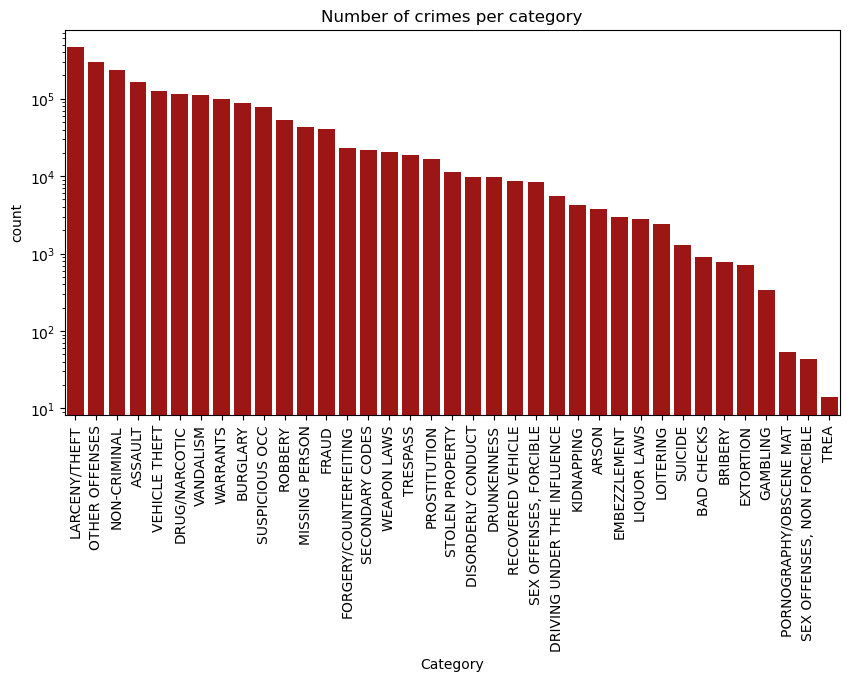

In [2]:
# Semi log plot:
# create a bar plot of the number of crimes per category
plt.figure(figsize=(10,5))
# make the y-axis logarithmic
plt.yscale("log")
sns.countplot(x="Category", data=data, order=data.Category.value_counts().index, color="#B30000")
plt.title("Number of crimes per category")
plt.xticks(rotation=90)
plt.show()

In [3]:
from math import radians, cos, sin, asin, sqrt
# Filter for Larceny/Theft
data = data[data["Category"] == "LARCENY/THEFT"]

# Remove outlier data of X and Y to only be in San Francisco p
data = data[data["X"] < -122]
data = data[data["Y"] < 50]


Create haversine function, that calculates the distance between two lan-lot coordinates:

In [4]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

Figuring out the square that incapsulates San Francisco, by looking at the min/max of lat/lon

In [5]:
lat_min = data.Y.min()
lat_max = data.Y.max()
lon_min = data.X.min()
lon_max = data.X.max()

How many bins are needed for 100 x 100 meter? We figure this out by calling the haversine function.
The result is in km so we multiply by 10 to get it for 100 meters.

In [6]:
print(f"Estimated bin amount along the western border of San Fransisco: {haversine(lon_min, lat_min, lon_min, lat_max)*10}") 
print(f"Estimated bin amount along the eastern border of San Fransisco: {haversine(lon_max, lat_min, lon_max, lat_max)*10}")
print(f"Estimated bin amount along the northern border of San Fransisco: {haversine(lon_min, lat_max, lon_max, lat_max)*10}")
print(f"Estimated bin amount along the southern border of San Fransisco: {haversine(lon_min, lat_min, lon_max, lat_min)*10}")

Estimated bin amount along the western border of San Fransisco: 125.31549767057172
Estimated bin amount along the eastern border of San Fransisco: 125.31549767057172
Estimated bin amount along the northern border of San Fransisco: 130.78123566673807
Estimated bin amount along the southern border of San Fransisco: 130.9806686298538


This shows us the bins needed for 100 x 100 meters, which are [130 x 125]
Now bin this as a 2D histogram using numpy, and plot it to see the bins represented as San Francisco, with higher crimes in lighter areas. There is set a max, as one outlier was oscuring the visualization.

Now bin this as a 2D histogram using numpy, and plot it to see the bins represented as San Francisco, with higher crimes in lighter areas. There is set a max, as one outlier was oscuring the visualization.

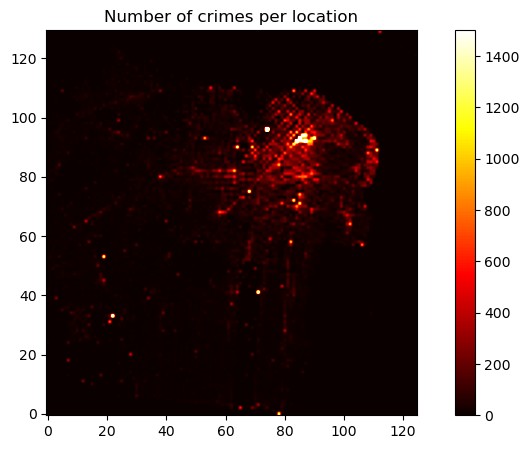

In [7]:
count, lon, lat = np.histogram2d(data.X, data.Y, bins=[130, 125])
# plot count using plt.imshow
plt.figure(figsize=(10,5))
plt.imshow(count, cmap="hot", vmax=1500, origin='lower')
plt.colorbar()
plt.title("Number of crimes per location")
plt.show()

In [8]:
print(lon.shape, lat.shape, count.shape)
print(count)

(131,) (126,) (130, 125)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]]


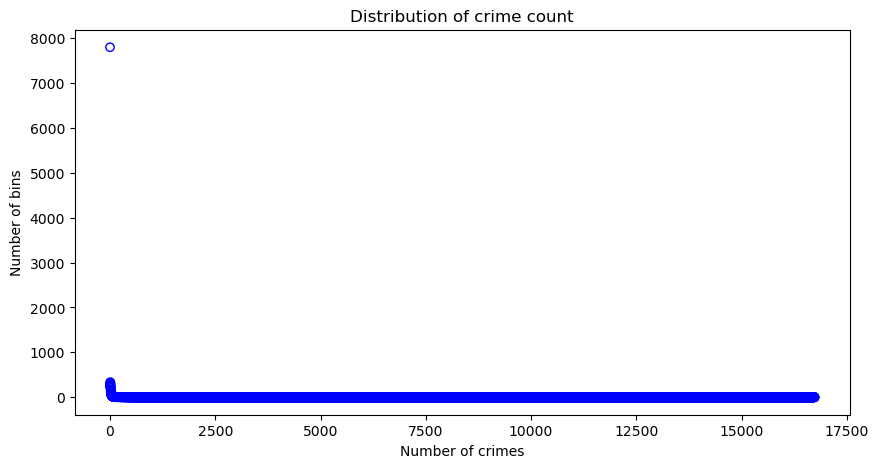

In [9]:
# Count the number of bins with n crimes in range n to max of count and store in a list
crime_count = []
for i in range(0, int(count.max())):
    crime_count.append(np.count_nonzero(count == i))

# plot the distribution of crime_count as scatter plot with empty circles
plt.figure(figsize=(10,5))
plt.scatter(range(0, int(count.max())), crime_count, marker="o", facecolors='none', edgecolors='b')
plt.title("Distribution of crime count")
plt.xlabel("Number of crimes")
plt.ylabel("Number of bins")
plt.show()


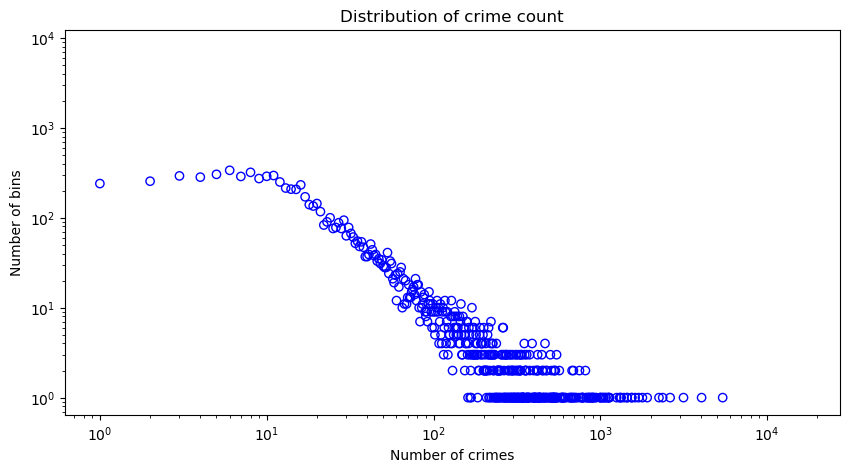

In [56]:
# plot the distribution of crime_count as scatter plot with empty circles
# make both axes logarithmic and fit a line to the data

plt.figure(figsize=(10,5))
plt.scatter(range(0, int(count.max())), crime_count, marker="o", facecolors='none', edgecolors='b')
plt.yscale("log")
plt.xscale("log")
plt.title("Distribution of crime count")
plt.xlabel("Number of crimes")
plt.ylabel("Number of bins")
plt.show()

The Theft data follows a power law distribution as we can see a clear downward trend in the data. The more crime occurences, the fewer bins. It starts out looking linear until 10^1 ish, as this is a log scale, it makes sence, as this represent very few numbers, compared to the rest of the x-axis.

## Part 2: Linear Regression

So, now it's time for fun with standard linear regression! We'll get into that by asking the following question. 

> *Which pair of focus crimes have the the most similar temporal pattern across the week? (And which pair is most dissimilar).*

Below I list the focus-crimes for your convenience

In [14]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])
data = data[data["Category"].isin(focuscrimes)]

One way to answer this question is to plot the activity for all pairs of crimetypes as scatter plot per pair. One crime type on each axis, and where each point in the scatter corresponds to an hour of the week, and the number of crimes of crime-type 1 is on the $x$-axis and the number of crimes of crime-type 2 is on the $y$-axis. (So there will be 168 points in each scatterplot.) If we look at 14 focus crimes that results in 91 pairwise comparisons. 

*Exercise*: Create the 91 scatterplots.
> * Display the plots in a $7$ by $13$ subplot matrix. You can use matplotlib's `subplot` to organize those plots. With $7$ across and $13$ down, you should be able to squeeze them all onto a single [a4](https://en.wikipedia.org/wiki/ISO_216#A_series) page.
>     * Make sure to label each one with the two crime-types you're comparing so we can easily inspect visually.
>     * Make sure that that you squeeze the subplots closely together so each plot can be as big as possible. 
> * Just inspecting this matrix, which crime-types look correlated and which one look like they're very different?

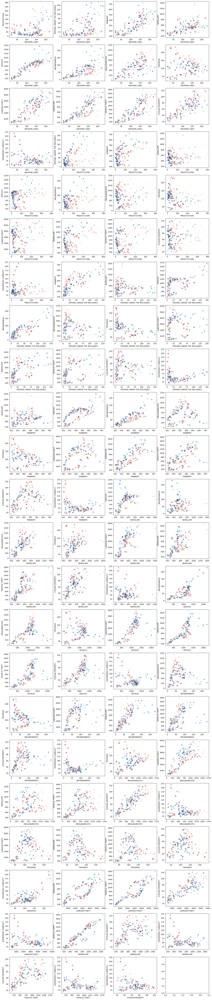

In [23]:
# Create a subset of the data grouped by category and Week_hour
data_cat = data.groupby(["Category", "Week_hour"]).size().reset_index(name="Occurences")

focuscrimes_list = list(focuscrimes)

# Create a color gradient going from red to blue. Hour 1 is red, hour 168 is blue
cmap = plt.cm.get_cmap('RdBu')

# Create subplots of scatter plots comparing each category to each other
rows = 0
cols = 0
fig, ax = plt.subplots(nrows=23, ncols=4, figsize=(20, 100))
for i in range(len(focuscrimes_list)):
    for j in range(i+1, len(focuscrimes_list)):
        # Dimensionen kan ikke være i,j, da den går fra 14-14-j. Vi laver i stedet en counter på rows of cols, som skaber vores figure.
        ax[rows, cols].scatter(data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences, data_cat.loc[data_cat.Category==focuscrimes_list[j]].Occurences, c=data_cat.loc[data_cat.Category==focuscrimes_list[i]].Week_hour, alpha=0.5, cmap=cmap)
        ax[rows, cols].set_xlabel(focuscrimes_list[i])
        ax[rows, cols].set_ylabel(focuscrimes_list[j])
        # Color each point according to the Week_hour by cmap
        cols += 1
        if cols == 4:
            cols = 0
            rows += 1
plt.show()

By looking at the 91 scatter plots of category pairs above, we see the following:

**Linear relationship:**
1. Weapon Laws vs Vehicle Theft
2. Stolen Property vs Vehicle Theft
3. Stolen Property vs Weapom Laws
4. Drunkenness vs Vehicle Theft
5. Drunkenness vs Weapon Laws
6. Drunkenness vs Stolen Property
7. Robbery vs Weapon Laws
8. Robbery vs Drunkennes
9. Vandalism vs Vehicle Theft
10. Vandalism vs Drunkennes
11. Vandalism vs Robbery
12. Assault vs Weapon Laws
13. Drug/Narcotics vs Stolen Property
14. Drunkennes vs Driving Under the Influence
15. Larceny/Theft vs Weapon Laws
16. Larceny/Theft vs Stolen Property
17. Burglary vs Drug/Narcotic

In general we can see that many crimes related to Drunkennes or Weapon Laws have a linear relationship with other crime categories.

**Non linear relationship:**
1. Vehicle Theft vs Disorderly Conduct
2. Weapon Laws vs Disorderly Conduct
3. Stolen Property vs Disorderly Conduct
4. Drunkennes vs Disorderly Conduct
5. Robbery vs Disorderly Conduct
6. Prostitution vs Vehicle Theft
7. Prostitution vs Weapon Laws
8. Prostitution vs Stolen Property
9. Vandalism vs Disorderly Conduct
10. Drug/ Narctotic vs Disorderly Conduct
11. Assault vs Prostitution
12. Drug/Narcotic vs Drunkenness
13. Drug/Narcotic vs Robbery
14. Driving under the Influence vs Disorderly Conduct
15. Driving under the Influence vs Drug/Narcotic
16. Driving under the Influence vs Stolen Property
17. Larceny/Theft vs Disorderly Conduct
18. Burglary vs Prostitution
18. Trespass vs Drukenness
20. Trespass vs Driving under the Influence
21. Trespass vs Robbery

In general, all crime related to Disorderly Conduct have a non-linear relationship to other crime categories. However, the shape of its scatter plot is always in a form following sort of a square root distribution. There could be opportunities to transform the values for Disorderly Conduct to its square root, in order to use a linear regression to make predictions for Disorderly Conduct crimes. Also Trespass and Prostitution crimes do not seem to be correlated with many other crime categories.

---

Next it's time for the linear regression. Janert writes about this on page 63-66. 

There is a closed-form solution for linear regression. If you want to find the best straight line $y = ax + b$ fit to a set of $N$ points $\{(x_1,y_1), (x_2,y_2), \ldots (x_N,y_N)\}$, the value of $b$ is

$$
\tag{1}
b = \langle y \rangle - a \langle x \rangle,
$$

where $\langle x \rangle = (1/N)\sum_i x_i$ is the mean value of the $x_i$ and $\langle y \rangle = (1/N)\sum_i x_i$ is the mean value of the $y_i$. 

And the value for the slope $a$ is 

$$
\tag{2}
a = \frac{\sum_{i=1}^N \left( x_iy_i \right) - N \langle x\rangle\langle y\rangle }{\sum_{i=1}^N\left( x_i^2 \right) - N\langle x\rangle^2}.
$$


A couple of years ago, I actually derived the whole thing. I've taken it out of the notebook. But if you'd like to take a look (it's a fun and instructive little exercise), you can find it **[here](https://github.com/suneman/socialdata2021/blob/main/lectures/LinearRegressionDerived.ipynb)**. 

We are going to focus on the fit for now, but keep in mind what we have learnt so far about the purpose of linear regression! 

*Exercise:* Linear regression.

> * Using the formulas we derived above (Equation 1 and 2), calculate the slopes for $a$ and $b$ in each case. (You can compare the results with ones obtained using a package like `sklearn` to check that everything is working as expected.)
> * You can add even more information to this plot by coloring each point according to its hour of the week. So create a gradient going from one color to another, and color each point according to the gradient. (So let's say your two colors are red and blue, then the Sunday, midnight to 1am bin will be red and the following Sunday, 11pm - midnight bin will be blue).

In [45]:
from sklearn.linear_model import LinearRegression
# Here we use sklearn. You could also use scipy.stats.linregress, np.polyfit, statsmodels.api.OLS or any other method
# Have not calculated the values manually...
b = []
for i in range(len(focuscrimes_list)):
    for j in range(i+1, len(focuscrimes_list)):
        # calculate the intercept of the linear regression
        X = data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences.values.reshape(-1,1)
        y = data_cat.loc[data_cat.Category==focuscrimes_list[j]].Occurences.values.reshape(-1,1)
        reg = LinearRegression().fit(X, y)
        b.append(reg.intercept_[0])

a = []
for i in range(len(focuscrimes_list)):
    for j in range(i+1, len(focuscrimes_list)):
        # calculate the slope of the linear regression
        X = data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences.values.reshape(-1,1)
        y = data_cat.loc[data_cat.Category==focuscrimes_list[j]].Occurences.values.reshape(-1,1)
        reg = LinearRegression().fit(X, y)
        a.append(reg.coef_[0][0])

r2 = []
for i in range(len(focuscrimes_list)):
    for j in range(i+1, len(focuscrimes_list)):
        # calculate the r2 of the linear regression
        X = data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences.values.reshape(-1,1)
        y = data_cat.loc[data_cat.Category==focuscrimes_list[j]].Occurences.values.reshape(-1,1)
        reg = LinearRegression().fit(X, y)
        r2.append(reg.score(X, y))


---

But the question we started with was "Which pair of focus crimes have the the most similar temporal pattern across the week?". We haven't really answered that yet. So let's calculate one last thing: $R^2$. You probably also remember this one. 

Basically $R^2$ is a measures of how good a linear fit is. You can [read about $R^2$ on wikipedia](https://en.wikipedia.org/wiki/Coefficient_of_determination). 

*Exercise:* Goodness of fit as a measure of correlation. 
> * Write a little function to calculate $R^2$ alongside each linear fit. (Again you can compare it with a package to check that it works, e.g. the one provided by the function `score()` in `sklearn`.)
> * Explain the connection between $R^2$ and the [Pearson correlation coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient).
> * **According to the fits and associated $R^2$**, which pair of crimes have the **most similar** temporal pattern. Discuss your finding: Does it make sense? Why?/Why not?
> * According to your fits and associated measure of $R^2$, which pair of crimes have the **most dissimilar** temporal pattern. Discuss your finding: Does it make sense? Why?/Why not?
> * Create a final mega-plot with all of the 91 megaplots, fits, and $R^2$ value written as [text](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.text.html) on each plot. In this figure, you should also find a way to visually highlight the two most similar/dissimilar crimes.

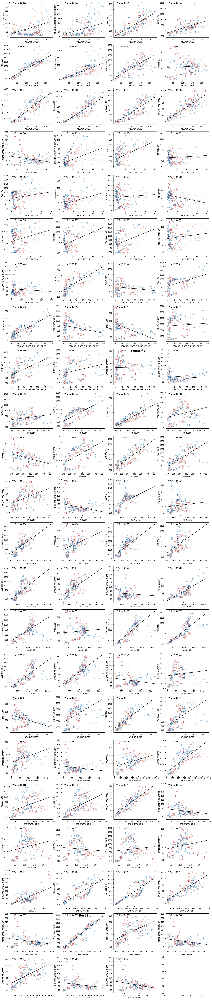

In [44]:
# Final mega-plot with linear regression fits, R^2 values.

# Counter for rows and columns in subplot matrix
rows = 0
cols = 0
fig, ax = plt.subplots(nrows=23, ncols=4, figsize=(20, 100))
for i in range(len(focuscrimes_list)):
    for j in range(i+1, len(focuscrimes_list)):
        ax[rows, cols].scatter(data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences, data_cat.loc[data_cat.Category==focuscrimes_list[j]].Occurences, c=data_cat.loc[data_cat.Category==focuscrimes_list[i]].Week_hour, alpha=0.5, cmap=cmap)
        ax[rows, cols].set_xlabel(focuscrimes_list[i])
        ax[rows, cols].set_ylabel(focuscrimes_list[j])
        # Include r^2 as text in each subplot
        ax[rows, cols].text(0.05, 0.98, "r^2 = " + str(round(r2[rows*4+cols], 2)), transform=ax[rows, cols].transAxes, fontsize=14, verticalalignment='top')
        # Fit the regression line for each subplot
        x = np.linspace(min(data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences), max(data_cat.loc[data_cat.Category==focuscrimes_list[i]].Occurences), 100)
        y = a[rows*4+cols]*x + b[rows*4+cols]
        ax[rows, cols].plot(x, y, color='black')
        # Highlight the The best and worst fit
        if r2[rows*4+cols] == max(r2):
            ax[rows, cols].text(0.4, 0.98, "Best fit", transform=ax[rows, cols].transAxes, fontsize=16, verticalalignment='top', weight='bold')
        if r2[rows*4+cols] == min(r2):
            ax[rows, cols].text(0.4, 0.98, "Worst fit", transform=ax[rows, cols].transAxes, fontsize=16, verticalalignment='top', weight='bold')
        cols += 1
        if cols == 4:
            cols = 0
            rows += 1
plt.show()